# Notices of Violation Served in San Francisco

# EDA 

In [241]:
# Import packages
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import zipcodes
import random
import math
import re
from geopy import Nominatim
import folium

In [242]:
# Set some options
%matplotlib inline
pd.options.display.max_columns = 999
pd.options.display.max_rows = 999

## Exploring the Dataset

First I will look at the column names in the dataset:

In [243]:
csv_path = 'Notices_of_Violation_issued_by_the_Department_of_Building_Inspection.csv'
print('Reading', csv_path, 'into DataFrame...')
try:
    df_csv = pd.read_csv(csv_path)
    print('... Done!')
except:
    print('Load failed!')

df_csv.head(5)

Reading Notices_of_Violation_issued_by_the_Department_of_Building_Inspection.csv into DataFrame...
... Done!


/home/joseph/Documents/r2_interview/r2-interview/lib/python3.6/site-packages/IPython/core/interactiveshell.py:3072: DtypeWarning: Columns (0) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,Complaint Number,Item Sequence Number,Date Filed,Block,Lot,Street Number,Street Name,Street Suffix,Unit,Status,Receiving Division,Assigned Division,NOV Category Description,Item,NOV Item Description,Neighborhoods - Analysis Boundaries,Supervisor District,Zipcode,Location,Supervisor Districts 2,Fire Prevention Districts 2,Current Police Districts 2,Neighborhoods - Analysis Boundaries 2 2,Zip Codes 2,Central Market/Tenderloin Boundary 2,Central Market/Tenderloin Boundary Polygon - Updated 2,Neighborhoods,SF Find Neighborhoods,Current Police Districts 3,Current Supervisor Districts
0,199817695,36719,12/09/1998,4734,001,1175,Oakdale,Av,NaN,not active,Department Of Bldg Inspection,Housing Inspection Services,building section,this notice includes violations for the areas ...,1175 oakdale av.,NaN,NaN,94124.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,199922899,35002,06/18/1999,1805,061,1444,La Playa,NaN,NaN,not active,Housing Inspection Services,Housing Inspection Services,other section,provide shutoff tool for gas utility shutoff (...,NaN,NaN,NaN,94122.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,199812655,17867,02/27/1998,2763,015,767,Corbett,Av,NaN,not active,Department Of Bldg Inspection,Housing Inspection Services,interior surfaces section,"repair damaged ceilings (1001b,h,o hc)",study room (wet ceiling) and family room.,NaN,NaN,94131.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,199927489,42583,11/18/1999,0517,010,116,29th,St,NaN,not active,Housing Inspection Services,Housing Inspection Services,building section,"repair window sash frame (1001(h),708 hc)",@ bathroom.,NaN,NaN,94110.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,199812452,17231,02/20/1998,1290,015,160,Carmel,St,NaN,not active,Housing Inspection Services,Housing Inspection Services,fire section,recharge/date tag fire extinguisher type 2a 10...,NaN,NaN,NaN,94117.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Inpection of the [Unique Idenfitier](https://data.sfgov.org/api/views/nbtm-fbw5) linked with this dataset gives context to the column names and dtypes. It seems like the last 11 columns were auto-generated to help plot polygons on maps, I may come back to this later but for now I will ignore these colums.  

I will re-read the csv, this time specifying the correct dtypes and ignoring the last 11 columns.

In [244]:
# dtype dictionary - using strings instead of ints because there are NaN columns which ints cannot handle
dtypes = {
    'Complaint Number': str,
    'Item Sequence Number': str,
    'Date Filed': str,  # Could parse datetimes here but won't have as many options as doing it explicitly later
    'Block': str,
    'Lot': str,
    'Street Number': str,
    'Street Name': str,
    'Street Suffix': str,
    'Unit': str,
    'Status': str,
    'Receiving Division': str,
    'Assigned Division': str,
    'NOV Category Description': str,
    'Item': str,
    'NOV Item Description': str,
    'Neighborhoods - Analysis Boundaries': str,
    'Supervisor District': str,
    'Zipcode': str,
    'Location': str,
}

rel_cols = list(dtypes.keys())
print(rel_cols)

['Complaint Number', 'Item Sequence Number', 'Date Filed', 'Block', 'Lot', 'Street Number', 'Street Name', 'Street Suffix', 'Unit', 'Status', 'Receiving Division', 'Assigned Division', 'NOV Category Description', 'Item', 'NOV Item Description', 'Neighborhoods - Analysis Boundaries', 'Supervisor District', 'Zipcode', 'Location']


In [245]:
print('Reading', csv_path, 'into DataFrame...')
try:
    df_focused_csv = pd.read_csv(csv_path, usecols=rel_cols, dtype=dtypes)
    print('... Done!')
except:
    print('Load failed!')

df_focused_csv.head(5)

Reading Notices_of_Violation_issued_by_the_Department_of_Building_Inspection.csv into DataFrame...
... Done!


,Complaint Number,Item Sequence Number,Date Filed,Block,Lot,Street Number,Street Name,Street Suffix,Unit,Status,Receiving Division,Assigned Division,NOV Category Description,Item,NOV Item Description,Neighborhoods - Analysis Boundaries,Supervisor District,Zipcode,Location
0,199817695,36719,12/09/1998,4734,001,1175,Oakdale,Av,NaN,not active,Department Of Bldg Inspection,Housing Inspection Services,building section,this notice includes violations for the areas ...,1175 oakdale av.,NaN,NaN,94124,NaN
1,199922899,35002,06/18/1999,1805,061,1444,La Playa,NaN,NaN,not active,Housing Inspection Services,Housing Inspection Services,other section,provide shutoff tool for gas utility shutoff (...,NaN,NaN,NaN,94122,NaN
2,199812655,17867,02/27/1998,2763,015,767,Corbett,Av,NaN,not active,Department Of Bldg Inspection,Housing Inspection Services,interior surfaces section,"repair damaged ceilings (1001b,h,o hc)",study room (wet ceiling) and family room.,NaN,NaN,94131,NaN
3,199927489,42583,11/18/1999,0517,010,116,29th,St,NaN,not active,Housing Inspection Services,Housing Inspection Services,building section,"repair window sash frame (1001(h),708 hc)",@ bathroom.,NaN,NaN,94110,NaN
4,199812452,17231,02/20/1998,1290,015,160,Carmel,St,NaN,not active,Housing Inspection Services,Housing Inspection Services,fire section,recharge/date tag fire extinguisher type 2a 10...,NaN,NaN,NaN,94117,NaN


In [246]:
# Describe the DataFrame
df_focused_csv.describe()

,Complaint Number,Item Sequence Number,Date Filed,Block,Lot,Street Number,Street Name,Street Suffix,Unit,Status,Receiving Division,Assigned Division,NOV Category Description,Item,NOV Item Description,Neighborhoods - Analysis Boundaries,Supervisor District,Zipcode,Location
count,508086,508086,508086,508086,508086,508086,508086,502259,75084,508086,508086,508085,508086,508025,471591,503580,503580,507776,503580
unique,86835,389412,6338,4421,694,4695,1485,20,216,2,12,6,10,52028,255590,41,11,27,32775
top,200560425,505721,01/08/2019,3703,001,20,Mission,St,0,not active,Housing Inspection Services,Housing Inspection Services,building section,inspector comments,it is the property owner's responsibility to b...,Mission,3,94110,POINT (-122.40939568270619 37.78104767802361)
freq,186,2,470,3151,26620,1829,14601,363411,67206,468523,381144,395993,141804,55998,2470,65839,75587,67175,1237


In [247]:
# Concatenate the Street columns together to form a single address column
street_cols = ['Street Number', 'Street Name', 'Street Suffix']
df_focused_csv['Address'] = df_focused_csv[street_cols].fillna('').apply(' '.join, axis=1)

In [248]:
# Drop a few more columns that are unlikely to be of any use:
useless = ['Complaint Number', 'Item Sequence Number', 'Block', 'Lot', 'Supervisor District', 'Unit', 'Street Number', 'Street Name', 'Street Suffix']
df_lean = df_focused_csv.drop(useless, axis=1)
df_lean.head()

,Date Filed,Status,Receiving Division,Assigned Division,NOV Category Description,Item,NOV Item Description,Neighborhoods - Analysis Boundaries,Zipcode,Location,Address
0,12/09/1998,not active,Department Of Bldg Inspection,Housing Inspection Services,building section,this notice includes violations for the areas ...,1175 oakdale av.,NaN,94124,NaN,1175 Oakdale Av
1,06/18/1999,not active,Housing Inspection Services,Housing Inspection Services,other section,provide shutoff tool for gas utility shutoff (...,NaN,NaN,94122,NaN,1444 La Playa
2,02/27/1998,not active,Department Of Bldg Inspection,Housing Inspection Services,interior surfaces section,"repair damaged ceilings (1001b,h,o hc)",study room (wet ceiling) and family room.,NaN,94131,NaN,767 Corbett Av
3,11/18/1999,not active,Housing Inspection Services,Housing Inspection Services,building section,"repair window sash frame (1001(h),708 hc)",@ bathroom.,NaN,94110,NaN,116 29th St
4,02/20/1998,not active,Housing Inspection Services,Housing Inspection Services,fire section,recharge/date tag fire extinguisher type 2a 10...,NaN,NaN,94117,NaN,160 Carmel St


In [249]:
# Change format of date filled column to datetime 
df_lean['Datetime'] = df_lean.apply(lambda row: pd.to_datetime(row['Date Filed'], infer_datetime_format=True, errors='coerce'), axis=1)

# Drop rows where a datetime can't be matched
df_datetime = df_lean.dropna(axis=0, subset=['Datetime']).drop('Date Filed', axis=1)
df_datetime.head()

,Status,Receiving Division,Assigned Division,NOV Category Description,Item,NOV Item Description,Neighborhoods - Analysis Boundaries,Zipcode,Location,Address,Datetime
0,not active,Department Of Bldg Inspection,Housing Inspection Services,building section,this notice includes violations for the areas ...,1175 oakdale av.,NaN,94124,NaN,1175 Oakdale Av,1998-12-09
1,not active,Housing Inspection Services,Housing Inspection Services,other section,provide shutoff tool for gas utility shutoff (...,NaN,NaN,94122,NaN,1444 La Playa,1999-06-18
2,not active,Department Of Bldg Inspection,Housing Inspection Services,interior surfaces section,"repair damaged ceilings (1001b,h,o hc)",study room (wet ceiling) and family room.,NaN,94131,NaN,767 Corbett Av,1998-02-27
3,not active,Housing Inspection Services,Housing Inspection Services,building section,"repair window sash frame (1001(h),708 hc)",@ bathroom.,NaN,94110,NaN,116 29th St,1999-11-18
4,not active,Housing Inspection Services,Housing Inspection Services,fire section,recharge/date tag fire extinguisher type 2a 10...,NaN,NaN,94117,NaN,160 Carmel St,1998-02-20


## Subset DataFrame to find Locations

We've got some rows that have location data, some that don't. Some of those that don't have location data have zipcode or address data or both or neither. Here I will split the DataFrame up as each will require a different mathod of getting to the Location data we want.

In [250]:
# Variable to give us the number of rows remaining in the DataFrame
n_rows = df_datetime.shape[0]
print(f'There are {n_rows} data points remaining in the DataFrame.')

There are 508074 data points remaining in the DataFrame.


In [251]:
# # Remove rows with no location data at all (useless to us)
# no_loc = df_datetime[(df_datetime['Zipcode'].isna()) & (df_datetime['Address'].isna()) & (df_datetime['Location'].isna())].index
# df_no_loc_dropped = df_datetime.drop(no_loc, axis=0)
# print('Dropped', len(no_loc), 'entries with no location data.')
# n_rows = df_no_loc_dropped.shape[0]
# print(n_rows, 'rows remain in the DataFrame.')

In [252]:
# # Convert the Zipcode column to Strings and remove trainling decimal notation using regex
# df_4['Zipcode'] = df_4['Zipcode'].astype(str).replace('\.0', '', regex=True)

# # Add columns for lat and long
# df_4['lat'] = ''
# df_4['long'] = ''

In [253]:
# Select subset where there is location data 
df_loc = df_datetime[df_datetime['Location'].isna() == False]
n_loc = df_loc.shape[0]
print(f'{n_loc}/{n_rows} rows already contain location data. ({(n_loc/n_rows)*100}%)')

503568/508074 rows already contain location data. (99.1131213169735%)


In [254]:
# Define function for splitting coordinates string into lat and long 
def split_coords(coords):
    coords = coords.strip('POINT ( )')
    return coords.split(' ')

df_loc[['long', 'lat']] = df_loc.apply(lambda row: split_coords(row['Location']), axis=1, result_type='expand')
df_loc.head()

/home/joseph/Documents/r2_interview/r2-interview/lib/python3.6/site-packages/pandas/core/frame.py:3069: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


,Status,Receiving Division,Assigned Division,NOV Category Description,Item,NOV Item Description,Neighborhoods - Analysis Boundaries,Zipcode,Location,Address,Datetime,long,lat
24,not active,Housing Inspection Services,Housing Inspection Services,building section,provide ventilation for garage (1001b(8) hc),NaN,Mission,94110,POINT (-122.40782451788053 37.75555659186614),1030 Hampshire St,2003-09-22,-122.40782451788053,37.75555659186614
26,not active,Housing Inspection Services,Housing Inspection Services,interior surfaces section,repair door.,#44,Mission,94110,POINT (-122.41495884998551 37.76508302580183),2791 16th St,2004-01-27,-122.41495884998551,37.76508302580183
28,not active,Housing Inspection Services,Housing Inspection Services,building section,leaking p trap under kitchen and bathroom sinks.,"eliminate leaks,repair/replace leaking drain u...",Nob Hill,94108,POINT (-122.40739149710981 37.79055362860451),604 Bush St,2004-02-04,-122.40739149710981,37.79055362860451
31,not active,Housing Inspection Services,Housing Inspection Services,other section,provide shutoff tool for gas utility shutoff (...,NaN,Mission,94103,POINT (-122.42140803212251 37.76796163010367),361 14th St,2006-02-01,-122.42140803212251,37.76796163010367
33,not active,Housing Inspection Services,Housing Inspection Services,smoke detection section,.,.,Outer Richmond,94121,POINT (-122.50953153140932 37.77567599052719),681 48th Av,2006-05-17,-122.50953153140932,37.77567599052719


In [255]:
# Select a subset of the DataFrame where Location is NaN but Zipcode is not
df_zipcode = df_datetime[(df_datetime['Location'].isna()) & (df_datetime['Zipcode'].isna() == False)]
n_zipcode = df_zipcode.shape[0]
print(f'{n_zipcode}/{n_rows} rows contain now location data but do have zipcodes. ({(n_zipcode/n_rows)*100}%)')

4278/508074 rows contain now location data but do have zipcodes. (0.8420033302235501%)


In [256]:
# Function to locate coordinates from zipcode 
def locate_zipcode(zipcode):
    return zipcodes.matching(zipcode)[0]['lat'], zipcodes.matching(zipcode)[0]['long']

# Apply this function to the reduced DataFrame
df_zipcode[['lat', 'long']] = df_zipcode.apply(lambda row: locate_zipcode(row['Zipcode']), axis=1, result_type='expand')
df_zipcode.head()

/home/joseph/Documents/r2_interview/r2-interview/lib/python3.6/site-packages/pandas/core/frame.py:3069: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


,Status,Receiving Division,Assigned Division,NOV Category Description,Item,NOV Item Description,Neighborhoods - Analysis Boundaries,Zipcode,Location,Address,Datetime,lat,long
0,not active,Department Of Bldg Inspection,Housing Inspection Services,building section,this notice includes violations for the areas ...,1175 oakdale av.,NaN,94124,NaN,1175 Oakdale Av,1998-12-09,37.7308,-122.3826
1,not active,Housing Inspection Services,Housing Inspection Services,other section,provide shutoff tool for gas utility shutoff (...,NaN,NaN,94122,NaN,1444 La Playa,1999-06-18,37.7620,-122.4831
2,not active,Department Of Bldg Inspection,Housing Inspection Services,interior surfaces section,"repair damaged ceilings (1001b,h,o hc)",study room (wet ceiling) and family room.,NaN,94131,NaN,767 Corbett Av,1998-02-27,37.7464,-122.4436
3,not active,Housing Inspection Services,Housing Inspection Services,building section,"repair window sash frame (1001(h),708 hc)",@ bathroom.,NaN,94110,NaN,116 29th St,1999-11-18,37.7487,-122.4158
4,not active,Housing Inspection Services,Housing Inspection Services,fire section,recharge/date tag fire extinguisher type 2a 10...,NaN,NaN,94117,NaN,160 Carmel St,1998-02-20,37.7692,-122.4425


In [257]:
# Select a subset where there is no location or zipcode, but there is an address
df_address = df_datetime[(df_datetime['Location'].isna()) & (df_datetime['Zipcode'].isna()) & (df_datetime['Address'].isna() == False)]
n_address = df_address.shape[0]
print(f'{n_address}/{n_rows} rows contain no location or zipcode data but do have addresses ({(n_address/n_rows)*100}%)')

228/508074 rows contain no location or zipcode data but do have addresses (0.044875352802938154%)


In [258]:
locator = Nominatim(user_agent="myGeocoder")

In [259]:
def locate_address(address):
    try:
        location = locator.geocode(address + ', San Francisco')
        return location.latitude, location.longitude
    except:
        return None, None

df_address[['lat', 'long']] = df_address.apply(lambda row: locate_address(row['Address']), axis=1, result_type='expand')
df_address.head()

/home/joseph/Documents/r2_interview/r2-interview/lib/python3.6/site-packages/pandas/core/frame.py:3069: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


,Status,Receiving Division,Assigned Division,NOV Category Description,Item,NOV Item Description,Neighborhoods - Analysis Boundaries,Zipcode,Location,Address,Datetime,lat,long
114,not active,Building Inspection Division,Building Inspection Division,other section,post enclosed gas meter instructional diagram ...,NaN,NaN,NaN,NaN,1580 La Playa,2003-05-01,-33.038216,-71.632916
115,active,Plumbing Inspection Division,Plumbing Inspection Division,other section,provide shutoff tool for gas utility shutoff (...,NaN,NaN,NaN,NaN,1204 Mariner - Ti Dr,2005-03-02,NaN,NaN
116,active,Plumbing Inspection Division,Plumbing Inspection Division,other section,inspector comments,#1007's complainant expressed concerns about l...,NaN,NaN,NaN,1201 Bayside - Ti Dr,2005-03-02,NaN,NaN
98361,not active,Housing Inspection Services,Housing Inspection Services,other section,inspector comments,no apparent violations.,NaN,NaN,NaN,0 Dolores St,2000-12-13,37.749438,-122.424864
200928,not active,Housing Inspection Services,Housing Inspection Services,building section,this notice includes violations for the areas ...,51-65 turner tr\nroutine inspection of the (co...,NaN,NaN,NaN,51 Turner Tr,2003-09-17,NaN,NaN


In [260]:
# It won't have been successfull every time so I will drop the rows where it hasn't worked
df_address_dropped_na = df_address.dropna(axis=0, subset=['lat'])
df_address_dropped_na.head()

,Status,Receiving Division,Assigned Division,NOV Category Description,Item,NOV Item Description,Neighborhoods - Analysis Boundaries,Zipcode,Location,Address,Datetime,lat,long
114,not active,Building Inspection Division,Building Inspection Division,other section,post enclosed gas meter instructional diagram ...,NaN,NaN,NaN,NaN,1580 La Playa,2003-05-01,-33.038216,-71.632916
98361,not active,Housing Inspection Services,Housing Inspection Services,other section,inspector comments,no apparent violations.,NaN,NaN,NaN,0 Dolores St,2000-12-13,37.749438,-122.424864
494776,not active,Building Inspection Division,Code Enforcement Section,fire section,"repair, maintain fire escape drop ladder in wo...",cable on fire escape ladder is rusty; arrange ...,NaN,NaN,NaN,1301 6th St,2004-03-19,-1.036502,-80.466529
494815,active,Plumbing Inspection Division,Plumbing Inspection Division,fire section,"recharge all fire extinguishers (905, 1001(m) hc)",**reminder** \nall fire extinguishers are requ...,NaN,NaN,NaN,850 Avenue D - Ti Av,2005-03-02,16.439368,121.644090
494965,not active,Building Inspection Division,Building Inspection Division,fire section,remove egress obstruction at ladder at rear (8...,the path of egress from each apartment is to b...,NaN,NaN,NaN,1580 La Playa,2003-05-01,-33.038216,-71.632916


In [261]:
# Some addresses have been found way outside of San Fran so I'll filter based on lat and long

df_address_lat = df_address_dropped_na[(df_address_dropped_na['lat'].astype(float) > 36) & (df_address_dropped_na['lat'].astype(float) < 39)]
df_address_long = df_address_lat[(df_address_lat['long'].astype(float) > -124) & (df_address_lat['long'].astype(float) < -120)]
df_address_long.head()

,Status,Receiving Division,Assigned Division,NOV Category Description,Item,NOV Item Description,Neighborhoods - Analysis Boundaries,Zipcode,Location,Address,Datetime,lat,long
98361,not active,Housing Inspection Services,Housing Inspection Services,other section,inspector comments,no apparent violations.,NaN,NaN,NaN,0 Dolores St,2000-12-13,37.749438,-122.424864
496934,not active,Building Inspection Division,Code Enforcement Section,other section,inspector comments,"inspector comments regarding ""follow up"" reins...",NaN,NaN,NaN,1 Shrader St,2007-10-18,37.774625,-122.453302
499210,not active,Building Inspection Division,Code Enforcement Section,other section,re-finish bathtub with an approved finish and ...,NaN,NaN,NaN,NaN,1 Shrader St,2007-10-18,37.774625,-122.453302
501493,not active,Building Inspection Division,Code Enforcement Section,building section,this notice includes violations for the areas ...,646 ofareel street apartment# 11.,NaN,NaN,NaN,1 Shrader St,2007-10-18,37.774625,-122.453302


In [262]:
# Concat each of the subsets back into a master DataFrame
master_df = pd.concat([df_zipcode, df_loc, df_address_long])
master_df.reset_index(inplace=True, drop=True)
master_df.head()

,Status,Receiving Division,Assigned Division,NOV Category Description,Item,NOV Item Description,Neighborhoods - Analysis Boundaries,Zipcode,Location,Address,Datetime,lat,long
0,not active,Department Of Bldg Inspection,Housing Inspection Services,building section,this notice includes violations for the areas ...,1175 oakdale av.,NaN,94124,NaN,1175 Oakdale Av,1998-12-09,37.7308,-122.3826
1,not active,Housing Inspection Services,Housing Inspection Services,other section,provide shutoff tool for gas utility shutoff (...,NaN,NaN,94122,NaN,1444 La Playa,1999-06-18,37.7620,-122.4831
2,not active,Department Of Bldg Inspection,Housing Inspection Services,interior surfaces section,"repair damaged ceilings (1001b,h,o hc)",study room (wet ceiling) and family room.,NaN,94131,NaN,767 Corbett Av,1998-02-27,37.7464,-122.4436
3,not active,Housing Inspection Services,Housing Inspection Services,building section,"repair window sash frame (1001(h),708 hc)",@ bathroom.,NaN,94110,NaN,116 29th St,1999-11-18,37.7487,-122.4158
4,not active,Housing Inspection Services,Housing Inspection Services,fire section,recharge/date tag fire extinguisher type 2a 10...,NaN,NaN,94117,NaN,160 Carmel St,1998-02-20,37.7692,-122.4425


In [263]:
# No longer have any use of the 'Location', 'Zipcode' or 'Address' columns so drop them. 
# I'm also skeptical that the 'Recieving' and 'Assigned' Division columns are of any value. Drop them too!
to_drop = ['Location', 'Zipcode', 'Address', 'Receiving Division', 'Assigned Division']
master_df_trimmed = master_df.drop(to_drop, axis=1)
master_df_trimmed.head()

,Status,NOV Category Description,Item,NOV Item Description,Neighborhoods - Analysis Boundaries,Datetime,lat,long
0,not active,building section,this notice includes violations for the areas ...,1175 oakdale av.,NaN,1998-12-09,37.7308,-122.3826
1,not active,other section,provide shutoff tool for gas utility shutoff (...,NaN,NaN,1999-06-18,37.7620,-122.4831
2,not active,interior surfaces section,"repair damaged ceilings (1001b,h,o hc)",study room (wet ceiling) and family room.,NaN,1998-02-27,37.7464,-122.4436
3,not active,building section,"repair window sash frame (1001(h),708 hc)",@ bathroom.,NaN,1999-11-18,37.7487,-122.4158
4,not active,fire section,recharge/date tag fire extinguisher type 2a 10...,NaN,NaN,1998-02-20,37.7692,-122.4425


In [264]:
# Now that everything's cleaned it's probably a good time to assign useful datatypes to each of the columns
dtypes = {
    'lat': float,
    'long': float
}

df_assigned_dtypes = master_df_trimmed.astype(dtypes)
df_assigned_dtypes.dtypes

Status                                         object
NOV Category Description                       object
Item                                           object
NOV Item Description                           object
Neighborhoods - Analysis Boundaries            object
Datetime                               datetime64[ns]
lat                                           float64
long                                          float64
dtype: object

# Using Logistic Regression to assign Neighborhoods to unassigned neighborhoods 

In [265]:
(df_assigned_dtypes['Neighborhoods - Analysis Boundaries'].isna().sum()/num_rows)*100

0.8427707120448112

In [266]:
# Come back to this maybe - probably not worth the effort for so few rows in the DataSet

## Text Cleaning and Tokenisation

In [267]:
# Select a random sample of the text-heavy columns to get a flavour of what's each means 
rand_num = []
n_rows = df_assigned_dtypes.shape[0]
for i in range(0, 5):
    rand_num.append(random.randint(0, n_rows))
df_assigned_dtypes.loc[rand_num, ['Item', 'NOV Item Description']]

,Item,NOV Item Description
86441,"repair floor covering in bathroom (1001b,j,o hc)",secure loose / install missing tiles along edg...
423826,"repair, maintain fire escape drop ladder in wo...","note: property manager, owner or the owner's ..."
296074,provide heat to each occupied habitable room f...,NaN
68260,"remove egress obstruction at (801,1001(l) hc)",install manual release device or permanently r...
131274,"install directional signs at (801, 1001(m) hc)","install ""exit"" signs on or over each hallway d..."


Looks to me like there's a bit of a crossover between what's supposed to be in these two columns so I will combine them togther as I don't realistically see any way of dealing with this without going through the DataFrame line by line. 

In [268]:
df_assigned_dtypes['text'] = df_assigned_dtypes['Item'].fillna('').str.cat(df_assigned_dtypes['NOV Item Description'].fillna(''), sep=" ")
df_text = df_assigned_dtypes.drop(['NOV Item Description', 'Item'], axis=1)
df_text.head()

,Status,NOV Category Description,Neighborhoods - Analysis Boundaries,Datetime,lat,long,text
0,not active,building section,NaN,1998-12-09,37.7308,-122.3826,this notice includes violations for the areas ...
1,not active,other section,NaN,1999-06-18,37.7620,-122.4831,provide shutoff tool for gas utility shutoff (...
2,not active,interior surfaces section,NaN,1998-02-27,37.7464,-122.4436,"repair damaged ceilings (1001b,h,o hc) study r..."
3,not active,building section,NaN,1999-11-18,37.7487,-122.4158,"repair window sash frame (1001(h),708 hc) @ ba..."
4,not active,fire section,NaN,1998-02-20,37.7692,-122.4425,recharge/date tag fire extinguisher type 2a 10...


In [269]:
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer 

stop_words = set(stopwords.words('english'))
wordnet_lemmatizer = WordNetLemmatizer()


from tqdm import tqdm
tqdm.pandas()

In [270]:
def my_tokenizer(s):
    s = s.lower() # downcase
    tokens = word_tokenize(s) # split string into words (tokens)
    tokens = [t for t in tokens if len(t) > 2] # remove short words, they're probably not useful
    tokens = [t for t in tokens if t.isalpha()]
    tokens = [wordnet_lemmatizer.lemmatize(t) for t in tokens] # put words into base form
    tokens = [t for t in tokens if t not in stop_words] # remove stopwords
#     tokens = [t for t in tokens if not any(c.isdigit() for c in t)] # remove any digits, i.e. "3rd edition"
    return tokens

In [271]:
df_text['tokens'] = df_text.progress_apply(lambda x: my_tokenizer(x['text']), axis=1)

100%|██████████| 507850/507850 [03:19<00:00, 2544.41it/s]


In [272]:
df_tokens = df_text.drop('text', axis=1)
df_tokens.head()

,Status,NOV Category Description,Neighborhoods - Analysis Boundaries,Datetime,lat,long,tokens
0,not active,building section,NaN,1998-12-09,37.7308,-122.3826,"[notice, includes, violation, area, noted, oak..."
1,not active,other section,NaN,1999-06-18,37.7620,-122.4831,"[provide, shutoff, tool, gas, utility, shutoff]"
2,not active,interior surfaces section,NaN,1998-02-27,37.7464,-122.4436,"[repair, damaged, ceiling, study, room, wet, c..."
3,not active,building section,NaN,1999-11-18,37.7487,-122.4158,"[repair, window, sash, frame, bathroom]"
4,not active,fire section,NaN,1998-02-20,37.7692,-122.4425,"[tag, fire, extinguisher, type, equivalent]"


There are likely to be some words that are used in most text descriptions, such as 'repair' or 'inspection'. These words aren't helpful to us. We can create a wordcloud from all the words in the data and spot any we think should be added to the stopwords list.

In [273]:
# Create a string of all tokens
all_tokens = []

for tokens in df_tokens['tokens']:
    for token in tokens:
        all_tokens.append(token)
    
all_tokens_str = ' '.join(all_tokens)
print(all_tokens_str[:500])

notice includes violation area noted oakdale provide shutoff tool gas utility shutoff repair damaged ceiling study room wet ceiling family room repair window sash frame bathroom tag fire extinguisher type equivalent inspector comment apparent violation time inspection repair damaged wall bedroom inspector comment apparent violation recharge fire extinguisher provide smoke detector stair top stair notice includes violation area noted sacramento repair damaged wall area penthouse door inspector co


In [274]:
from wordcloud import WordCloud
from PIL import Image

In [275]:
wordcloud = WordCloud().generate(all_tokens_str)

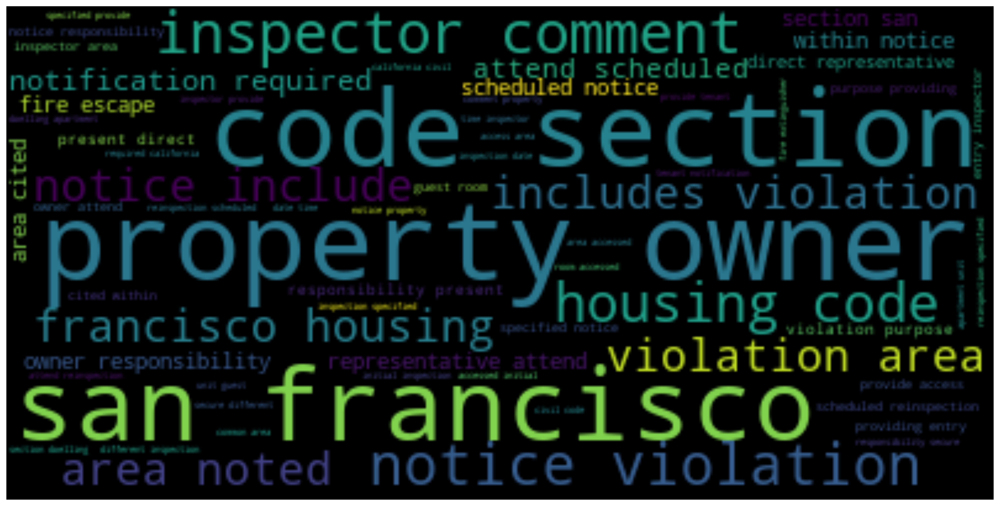

In [276]:
plt.figure(figsize=(20,20), dpi=500)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

As expected, there are quite a few words here we would expect to see that don't really tell us anything about the violation. For example, 'San Francisco' isn't helpful to us here as all the properties are in San Franciso! 

We can write some of these stop words and add them to the nltk stopwords set from before, then run this analysis again. Note: we may have to iterate this a couple of times until we're happy that we've caught most of the major stopwords. 

In [277]:
stop_words = stop_words.union({
    'san', 'francisco', 'property', 'owner', 'inspector', 'comment', 'includes', 'representative', 'attend',
    'section', 'notice', 'violation', 'violation', 'area', 'include', 'purpose', 'providing', 'responsibility',
    'housing', 'code', 'area', 'cited', 'violation', 'notification', 'attend', 'scheduled', 'reinspection',
    'present', 'inspection', 'provide', 'initial', 'date', 'time', 'california', 'within', 'specified',
    'unit', 'civil', 'apartment', 'different', 'tenant', 'direct', 'dwelling', 'guest', 'room'})

print(stop_words)

{'tenant', 'these', 'doesn', 'from', 'responsibility', 'housing', 'through', 'most', "hasn't", 'o', 'not', 'down', 'cited', 'have', 'comment', 'will', 'to', 'of', 'other', 'again', 'wouldn', 's', 'inspection', 'providing', 'what', "you're", 'mustn', "won't", "doesn't", 'do', 'room', 'during', 'after', 'violation', 'include', 'itself', 'present', 'them', 'our', 'd', 'himself', 've', 'ma', "hadn't", 'at', 'ourselves', 'didn', 'shouldn', 'ours', 'm', "aren't", 'apartment', 'too', 'under', 'having', 'provide', "should've", 't', 'been', 'hadn', 'code', "you'll", "you'd", 'out', 'shan', 'their', "she's", 'same', 'about', 'then', 'it', 'we', 'reinspection', "mightn't", 'as', 'had', 'is', 'were', 'a', 'yourselves', "shouldn't", 'being', 'both', 'don', 'within', 'y', 'he', 'or', 'before', 'because', 'his', 'who', 'when', "it's", 'attend', 'any', 'purpose', 'those', 'ain', 'i', 'notice', 'yours', 're', 'now', 'initial', 'does', "wasn't", 'only', 'time', "couldn't", 'isn', 'notification', 'dwelli

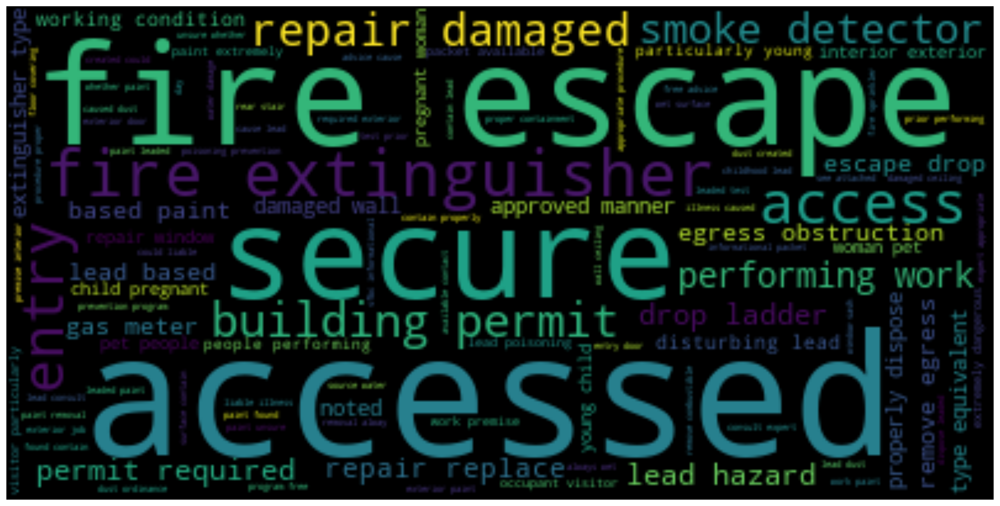

In [278]:
wordcloud = WordCloud(stopwords=stop_words).generate(all_tokens_str)
plt.figure(figsize=(20,20), dpi=500)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

Looks good now! We can now run our tokenizer function on the dataframe again to remove these stopwords

In [ ]:
df_text['tokens_improved'] = df_text.progress_apply(lambda x: my_tokenizer(x['text']), axis=1)
df_tokenized = df_text.drop(['text', 'tokens'], axis=1)
df_tokenized.head()

 97%|█████████▋| 490910/507850 [03:12<00:08, 2095.01it/s]

In [ ]:
map = folium.Map(
    location = [37.7749, -122.4194],
    zoom_start=12
    )

# random_df.apply(lambda row: folium.CircleMarker(location=[row['lat'], row['long']]).add_to(map), axis=1)

map

In [ ]:
master_df['Neighborhoods - Analysis Boundaries'].unique()

In [ ]:
from folium.plugins import HeatMap

In [ ]:
random_df['count'] = 1

HeatMap(data=random_df[['lat', 'long', 'count']]).add_to(map)

map

In [ ]:
# Change format of date filled column to datetime 
master_df['datetime'] = master_df.apply(lambda row: pd.to_datetime(row['Date Filed'], infer_datetime_format=True, errors='coerce'), axis=1)

master_df = master_df.dropna(axis=0, subset=['datetime'])
master_df.head()

In [ ]:
master_df = master_df.dropna(axis=0, subset=['datetime'])
master_df.head()

In [ ]:
# Check that the combined length of the split DataFrames adds up to the length of the original DataFrame
print('Number of rows in the original DataFrame:', n_rows)
print('Combined number of rows in the split DataFrames:', n_zipcode + n_loc + n_address)

In [ ]:
# Select a random sample of the text-heavy columns to get a flavour of what's each means 
master_df.loc[random_nums, ['Item', 'NOV Item Description']]

Looks to me like there's a bit of a crossover between what's supposed to be in these two columns so I will combine them togther as I don't realistically see any way of dealing with this without going through the DataFrame line by line. 

In [ ]:
master_df['text'] = master_df['Item'].fillna('').str.cat(master_df['NOV Item Description'].fillna(''), sep=" ")
master_df.head()

In [ ]:
# Select a subset of the DataFrame where Location is NaN but Zipcode is not
df_subset = df_4[(df_4['Location'].isna()) & (df_4['Zipcode'] != 'nan')][['Zipcode', 'Location']]

# Loop through the subset and assign lat and long values to new columns based on zipcodes
success = 0
fail = 0
for index, row in df_subset.iterrows():
    try:
        df_subset.at[index, 'lat'] = zipcodes.matching(row['Zipcode'])[0]['lat']
        df_subset.at[index, 'long'] = zipcodes.matching(row['Zipcode'])[0]['long']
        success += 1
    except:
        fail += 1
        
print('pass:', success, 'fail', fail)

In [ ]:
df_subset.head()

In [ ]:
# Update original Dataframe with the new subset 
df_4.update(df_subset)

In [ ]:
df_5[['lat', 'long']] = df_4['Location']

- [ ] Need to fill in all the rows without data

In [ ]:
# Explore random samples of the text columns 
text_cols = ['NOV Category Description', 'Item', 'NOV Item Description']
df_4[text_cols].iloc[random_nums,:]

- [ ] temporal analysis 
- [ ] location analysis
- [ ] animate temporal analysis on map

Ideas:

* Do your NLP analysis on the things and then heamap each different problem
* You will need to do LSA if you want 